In [11]:
!pip install duckdb ydata-profiling pycaret  xgboost lightgbm catboost

^C


In [1]:
import pandas as pd
import numpy as np
import duckdb
import plotnine as p9

import pandas as pd
from sklearn.preprocessing import KBinsDiscretizer
from kmodes.kmodes import KModes

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

from kmodes.kprototypes import KPrototypes
from sklearn.metrics import adjusted_rand_score


In [2]:
full_train_csv_data = pd.read_csv("playground-series-s4e12/train.csv")
full_test_csv_data = pd.read_csv("playground-series-s4e12/test.csv")

In [3]:
len(full_test_csv_data)

800000

In [4]:
len(full_train_csv_data)

1200000

In [5]:
import pandas as pd
from pycaret.regression import setup, compare_models, add_metric

In [6]:
# Separate numeric and categorical columns
numeric_cols = full_test_csv_data.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = full_test_csv_data.select_dtypes(include=['object']).columns

In [7]:
categorical_cols

Index(['Gender', 'Marital Status', 'Education Level', 'Occupation', 'Location',
       'Policy Type', 'Policy Start Date', 'Customer Feedback',
       'Smoking Status', 'Exercise Frequency', 'Property Type'],
      dtype='object')

In [8]:
def treat_dataset_pandas_init(dataset):
    dataset = dataset.copy()
    dataset['Policy Start Date'] = pd.to_datetime(dataset['Policy Start Date'])
    # Get the last date in the dataset
    last_date = dataset['Policy Start Date'].max()
    
    # Add 1 day to the last date
    reference_date = last_date + pd.Timedelta(days=1)
    
    # Calculate Customer Tenure in years from the reference date
    dataset['Customer Tenure'] = (reference_date - dataset['Policy Start Date']).dt.days / 365
    dataset['Claim Frequency'] = dataset['Previous Claims'] / dataset['Insurance Duration']
    # Extract year, month, day, hour, minute, second from 'Policy Start Date'
    dataset['Policy Start Year'] = dataset['Policy Start Date'].dt.year
    dataset['Policy Start Month'] = dataset['Policy Start Date'].dt.month
    dataset['Policy Start Day'] = dataset['Policy Start Date'].dt.day
    dataset['Policy Start Hour'] = dataset['Policy Start Date'].dt.hour
    dataset['Policy Start Minute'] = dataset['Policy Start Date'].dt.minute
    dataset['Policy Start Second'] = dataset['Policy Start Date'].dt.second
    dataset['Null columns'] = dataset.isnull().sum(axis=1)

    del dataset["id"]
    del dataset["Policy Start Date"]

    if "Premium Amount" in dataset.columns:
        dataset["Premium Amount"] = np.log10(dataset["Premium Amount"] + 1)

    dataset["Annual Income log 10"] = np.log10(dataset["Annual Income"])
    dataset["Previous Claims log"] = np.log1p(dataset["Previous Claims"])

    for col in [col for col in dataset.columns if col not in ["Premium Amount","id"]]:
        dataset[f"{col}_null"] = dataset[col].isnull()
    
    for col in categorical_cols:
        if col in dataset.columns:
            dataset[col] =  dataset[col].astype("category")
    
    return dataset

In [9]:
train_data = treat_dataset_pandas_init(full_train_csv_data)
test_data = treat_dataset_pandas_init(full_test_csv_data)

In [10]:
for i in range(0, 10):
    train_data["rand_var_%s" %i] = np.random.rand(len(train_data))
    
    test_data["rand_var_%s" % i] = np.random.rand(len(test_data))

In [11]:
X_train = train_data[[col for col in train_data.columns if col != "Premium Amount"]]
y_train = train_data["Premium Amount"]
X_val = test_data[[col for col in test_data.columns if col != "Premium Amount"]]

# Lighbm

In [14]:
from sklearn.metrics import root_mean_squared_log_error

In [15]:
def rmsle_objective(y_pred, dataset):
    y_true = dataset.get_label()
    
    y_true = np.power(10, y_true)
    y_pred = np.power(10, y_pred)
    
    # Ensure no negative predictions
    y_pred = np.maximum(y_pred, 1e-15)
    log_diff = np.log(y_pred + 1) - np.log(y_true + 1)
    grad = 2 * log_diff / (y_pred + 1)
    hess = 2 / (y_pred + 1)**2
    
    return grad, hess

def rmsle_metric(y_pred, y_true):    
    y_true = np.power(10, y_true) - 1
    y_pred = np.power(10, y_pred) - 1

    rmsle = root_mean_squared_log_error(y_true, y_pred)
    
    return 'rmsle', rmsle, False  # False because lower is better

In [16]:
import lightgbm as lgb
import numpy as np
from sklearn.model_selection import KFold


In [17]:
y_train.min()

1.3222192947339193

In [18]:
import xgboost as xgb


In [19]:
from sklearn.model_selection import ShuffleSplit
import numpy as np

# Define a 60-40 split
splitter = ShuffleSplit(n_splits=5, test_size=0.4, random_state=1)

for train_idx, val_idx in splitter.split(X_train):
    print("Starting")
    # Prepare data for LightGBM
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Train model
    model = xgb.XGBRFRegressor(enable_categorical=True)
    model.fit(X_train_fold, y_train_fold)
    
    train_score = rmsle_metric(model.predict(X_train_fold), y_train_fold)
    val_score = rmsle_metric(model.predict(X_val_fold), y_val_fold)

    print(f"Train: {train_score}, Test: {val_score}")

Starting
Train: ('rmsle', 1.049482042619834, False), Test: ('rmsle', 1.047747283522747, False)
Starting
Train: ('rmsle', 1.0487160038053982, False), Test: ('rmsle', 1.0495106631465407, False)
Starting
Train: ('rmsle', 1.0486206324409888, False), Test: ('rmsle', 1.0490272543545232, False)
Starting
Train: ('rmsle', 1.0494793281133628, False), Test: ('rmsle', 1.0482300908645115, False)
Starting
Train: ('rmsle', 1.0499084064128625, False), Test: ('rmsle', 1.047590493969123, False)


In [20]:
importances = pd.Series(model.get_booster().get_score(importance_type='total_gain')).reset_index()
importances.columns = ["column", "gain"]
importances["rand_var"] = importances["column"].str.contains("rand_var")

importances["better_than_probe_avg"] = (importances["gain"] > importances.loc[importances["rand_var"], "gain"].mean()) & ~importances["rand_var"]
importances =importances.sort_values(by="gain")
usable_columns = list(importances[importances["better_than_probe_avg"]]["column"].values)

In [21]:
usable_columns

['Marital Status_null',
 'Annual Income_null',
 'Health Score_null',
 'Claim Frequency',
 'Customer Tenure',
 'Previous Claims log',
 'Annual Income log 10',
 'Policy Start Year',
 'Customer Feedback_null',
 'Previous Claims',
 'Health Score',
 'Annual Income',
 'Credit Score']

# LightGBM Limited Features

In [58]:
X_train_fixed = X_train.loc[:, usable_columns]

In [59]:
from sklearn.model_selection import ShuffleSplit
import numpy as np

# Define a 60-40 split
splitter = ShuffleSplit(n_splits=5, test_size=0.4, random_state=1)

for train_idx, val_idx in splitter.split(X_train):
    print("Starting")
    # Prepare data for LightGBM
    X_train_fold, X_val_fold = X_train_fixed.iloc[train_idx], X_train_fixed.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Train model
    model = xgb.XGBRegressor(enable_categorical=True)
    model.fit(X_train_fold, y_train_fold)
    
    train_score = rmsle_metric(model.predict(X_train_fold), y_train_fold)
    val_score = rmsle_metric(model.predict(X_val_fold), y_val_fold)

    print(f"Train: {train_score}, Test: {val_score}")

Starting
Train: ('rmsle', 1.0331830114451066, False), Test: ('rmsle', 1.0467396297564875, False)
Starting
Train: ('rmsle', 1.0327830016567017, False), Test: ('rmsle', 1.0479287883710744, False)
Starting
Train: ('rmsle', 1.0325964274998858, False), Test: ('rmsle', 1.0482718572907312, False)
Starting
Train: ('rmsle', 1.0336038207087093, False), Test: ('rmsle', 1.0469469957756516, False)
Starting
Train: ('rmsle', 1.0334762159344377, False), Test: ('rmsle', 1.0464170232209726, False)


In [62]:
from statsmodels.distributions.empirical_distribution import ECDF
import matplotlib.pyplot as plt

def rescale(series, from_min, from_max, to_min, to_max):
    return to_min + ((series - from_min) * (to_max - to_min)) / (from_max - from_min)


In [63]:
y_train_pred = model.predict(X_train_fold)


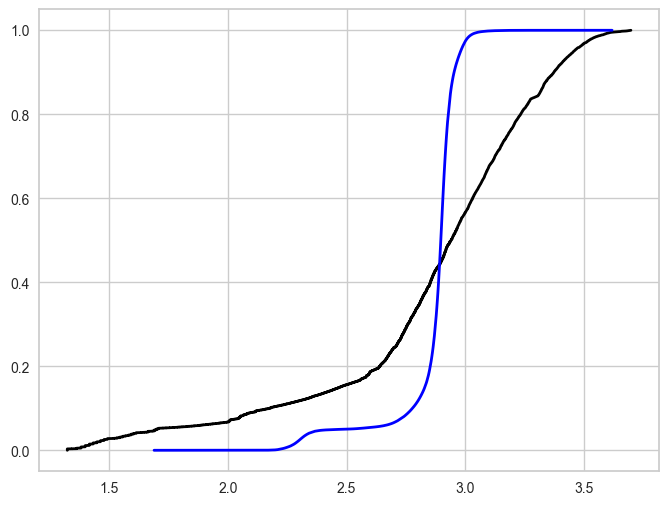

In [64]:
ecdf_target = ECDF(y_train_fold)
ecdf_model = ECDF(y_train_pred)

# Plot the CDFs
plt.figure(figsize=(8, 6))
plt.plot(ecdf_target.x, ecdf_target.y, label="Target (Actual)", lw=2, color="black")
plt.plot(ecdf_model.x, ecdf_model.y, label="Model 1", lw=2, color="blue")

In [65]:
y_min, y_max = y_train_fold.min(), y_train_fold.max()
y_train_pred_min, y_train_pred_max = y_train_pred.min(), y_train_pred.max()

y_pred_rescaled = rescale(y_train_pred, y_train_pred_min, y_train_pred_max, y_min, y_max)

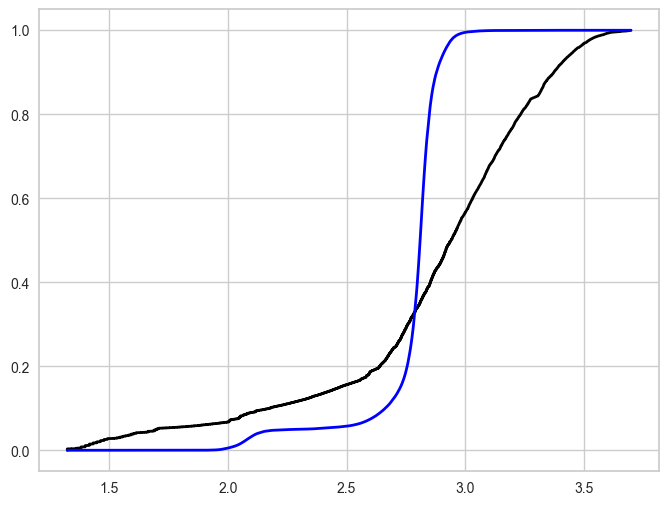

In [66]:
ecdf_target = ECDF(y_train_fold)
ecdf_model = ECDF(y_pred_rescaled)

# Plot the CDFs
plt.figure(figsize=(8, 6))
plt.plot(ecdf_target.x, ecdf_target.y, label="Target (Actual)", lw=2, color="black")
plt.plot(ecdf_model.x, ecdf_model.y, label="Model 1", lw=2, color="blue")

In [47]:
y_pred_rescaled

array([2.8287554, 2.8572743, 2.8263571, ..., 2.7728336, 2.7742248,
       2.8270564], dtype=float32)

In [100]:
import matplotlib.pyplot as plt

In [101]:
y_train_fold.max()

3.6987962517904314

In [102]:
model.predict(X_train_fold).max()

3.1399137486875675

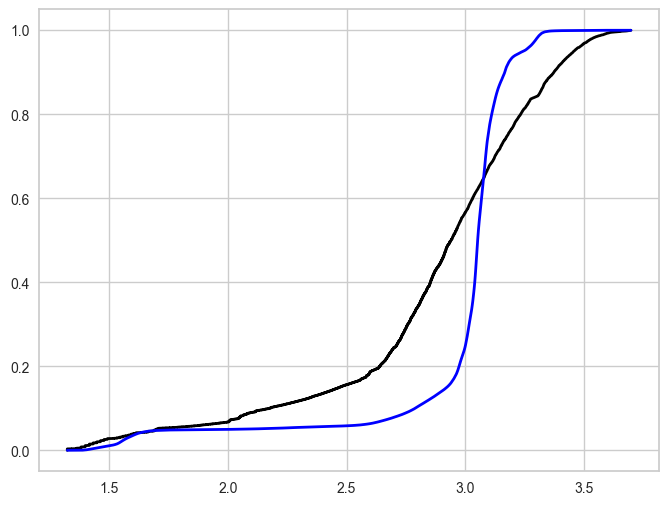

In [37]:
model.predict(X_train_fold)

array([2.91963939, 2.9400315 , 2.91739902, ..., 2.8546795 , 2.8870869 ,
       2.89223733])

In [35]:
from statsmodels.distributions.empirical_distribution import ECDF


In [32]:
from pycaret.regression import setup, compare_models, add_metric

In [39]:
import lightgbm as lgb

# Prepare LightGBM dataset
train_data_lgbm = lgb.Dataset(X_train, label=y_train)
#val_data_lgbm = lgb.Dataset(X_val, label=y_val, reference=train_data)

# Parameters
params = {
    'boosting_type': 'gbdt',
    'learning_rate': 0.05,
    'num_leaves': 31,
    'max_depth': 8,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.8,
    'bagging_freq': 1,
    'random_state': 123
}

# Train LightGBM with custom RMSLE objective and metric
model = lgb.train(
    params,
    train_data,
    num_boost_round=500,
    valid_sets=[val_data],
    early_stopping_rounds=50,
    fobj=rmsle_objective,  # Custom RMSLE objective
    feval=rmsle_metric,    # Custom RMSLE metric
    verbose_eval=100
)

NameError: name 'y_val' is not defined

In [17]:
light{
    'boosting_type': 'gbdt',       # Gradient Boosting Decision Trees
    'class_weight': 'balanced',    # Automatically balance classes (for classification)
    'colsample_bytree': 0.8,       # Randomly sample features for each tree (0.6–0.9 range often works)
    'importance_type': 'gain',     # More informative than 'split' for most use cases
    'learning_rate': 0.05,         # Slower learning for better generalization
    'max_depth': 8,                # Limit tree depth for smaller models
    'min_child_samples': 50,       # Minimum samples per leaf (increase for smaller datasets)
    'min_child_weight': 1e-3,      # Minimum sum of instance weights needed in a child
    'min_split_gain': 0.01,        # Minimum loss reduction for a split
    'n_estimators': 500,           # Increase for more trees, pair with early stopping
    'n_jobs': -1,                  # Use all available threads
    'num_leaves': 31,              # Default is fine for most cases; tweak with `max_depth`
    'objective': 'binary',         # Set based on task ('binary', 'regression', etc.)
    'random_state': 123,           # Seed for reproducibility
    'reg_alpha': 1.0,              # L1 regularization for better generalization
    'reg_lambda': 1.0,             # L2 regularization for better generalization
    'subsample': 0.8,              # Randomly sample rows for each tree
    'subsample_for_bin': 200000,   # Number of samples for histogram bins
    'subsample_freq': 1,           # Frequency of subsampling (1 for enabling)
}

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': 123,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [15]:
compare_models?

Signature:
compare_models(
    include: Optional[List[Union[str, Any]]] = None,
    exclude: Optional[List[str]] = None,
    fold: Union[int, Any, NoneType] = None,
    round: int = 4,
    cross_validation: bool = True,
    sort: str = 'R2',
    n_select: int = 1,
    budget_time: Optional[float] = None,
    turbo: bool = True,
    errors: str = 'ignore',
    fit_kwargs: Optional[dict] = None,
    groups: Union[str, Any, NoneType] = None,
    experiment_custom_tags: Optional[Dict[str, Any]] = None,
    engine: Optional[Dict[str, str]] = None,
    verbose: bool = True,
    parallel: Optional[pycaret.internal.parallel.parallel_backend.ParallelBackend] = None,
)
Docstring:
This function trains and evaluates performance of all estimators available in the
model library using cross validation. The output of this function is a score grid
with average cross validated scores. Metrics evaluated during CV can be accessed
using the ``get_metrics`` function. Custom metrics can be added or removed u

In [14]:
best_model

[]

In [10]:
reg = setup(data=train_data, target='your_target_column', silent=True, session_id=123)

NameError: name 'data' is not defined

In [217]:
full_train_csv_data.dtypes

id                               int64
Age                            float64
Gender                          object
Annual Income                  float64
Marital Status                  object
Number of Dependents           float64
Education Level                 object
Occupation                      object
Health Score                   float64
Location                        object
Policy Type                     object
Previous Claims                float64
Vehicle Age                    float64
Credit Score                   float64
Insurance Duration             float64
Policy Start Date       datetime64[ns]
Customer Feedback               object
Smoking Status                  object
Exercise Frequency              object
Property Type                   object
Premium Amount                 float64
dtype: object

Initialization method and algorithm are deterministic. Setting n_init to 1.
Best run was number 1
Gender
Marital Status
Education Level
Occupation
Location
Policy Type
Customer Feedback
Smoking Status
Exercise Frequency
Property Type


In [299]:
centroids

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Customer Feedback,Smoking Status,Exercise Frequency,Property Type
0,40.868246,Female,49084.365561,Divorced,2.036651,Master's,Missing,25.965273,Urban,Comprehensive,1.007899,9.275829,581.439810,5.095735,Poor,Yes,Rarely,House
1,40.888087,Male,13714.731173,Married,1.992522,Master's,Missing,25.303949,Rural,Premium,1.005117,9.548937,607.559958,5.043689,Poor,No,Weekly,House
2,40.829349,Female,107907.107172,Divorced,2.042045,Bachelor's,Missing,26.743642,Suburban,Premium,1.134378,9.628195,532.140148,4.964551,Poor,Yes,Daily,Condo


In [253]:
encoded_data.columns


Index(['Age', 'Gender', 'Annual Income', 'Marital Status',
       'Number of Dependents', 'Education Level', 'Occupation', 'Health Score',
       'Location', 'Policy Type', 'Previous Claims', 'Vehicle Age',
       'Credit Score', 'Insurance Duration', 'Customer Feedback',
       'Smoking Status', 'Exercise Frequency', 'Property Type'],
      dtype='object')

In [252]:
encoders["Gender"centroids

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Customer Feedback,Smoking Status,Exercise Frequency,Property Type
0,1.027767,9.568302,590.359141,4.999797,1.382651,0.506283,1.484597,1.001824,41.0,1.0,23891.0,1.0,2.0,2.0,1.0,24.695825,1.0,2.0
1,0.960907,9.695315,414.999403,5.042375,1.367353,0.496867,1.496568,1.020889,41.0,0.0,23891.0,0.0,2.0,2.0,1.0,24.695825,0.0,0.0
2,1.016420,9.779542,759.112248,5.047376,1.388156,0.499327,1.520592,1.014536,41.0,1.0,23891.0,3.0,2.0,0.0,1.0,24.695825,0.0,0.0


In [232]:
encoders

{'Gender': LabelEncoder(),
 'Marital Status': LabelEncoder(),
 'Education Level': LabelEncoder(),
 'Occupation': LabelEncoder(),
 'Location': LabelEncoder(),
 'Policy Type': LabelEncoder(),
 'Customer Feedback': LabelEncoder(),
 'Smoking Status': LabelEncoder(),
 'Exercise Frequency': LabelEncoder(),
 'Property Type': LabelEncoder()}

In [201]:
full_test_csv_data['Age']

0         28.0
1         31.0
2         47.0
3         28.0
4         24.0
          ... 
799995    50.0
799996     NaN
799997    26.0
799998    34.0
799999    25.0
Name: Age, Length: 800000, dtype: float64

In [ ]:
# Ensure 'Policy Start Date' column is in datetime format
full_train_csv_data['Policy Start Date'] = pd.to_datetime(full_train_csv_data['Policy Start Date'])
full_test_csv_data['Policy Start Date'] = pd.to_datetime(full_test_csv_data['Policy Start Date'])

# Revision temporal

In [128]:
# De cara a una competencia Kaggle la primera pregunta es si realmente podre explotar la informacion temporal. Tengo que ver como se relaciona temporalmente test y train.

In [129]:
# Function to sort columns by numeric first, then string/object-like
numeric_cols = [col for col in full_test_csv_data.columns if np.issubdtype(full_test_csv_data[col].dtype, np.number)]
non_numeric_cols = [col for col in full_test_csv_data.columns if not np.issubdtype(full_test_csv_data[col].dtype, np.number)]
target_col = "Premium Amount"
sorted_columns = numeric_cols + non_numeric_cols

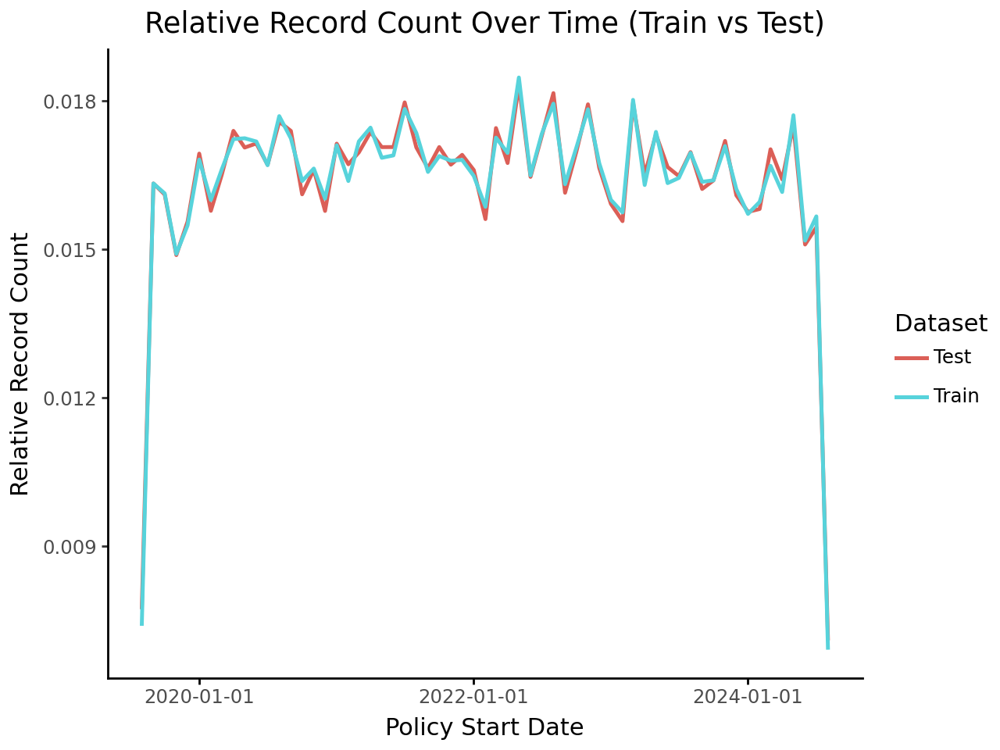

In [130]:
# Group by year-month and calculate the required metrics for train data
train_monthly_data = (
    full_train_csv_data
    .groupby(full_train_csv_data['Policy Start Date'].dt.to_period('M'))
    .agg(
        record_count=('Policy Start Date', 'size'),
        avg_premium=('Premium Amount', 'mean')
    )
    .reset_index()
)
train_monthly_data['Policy Start Date'] = train_monthly_data['Policy Start Date'].dt.to_timestamp()
train_monthly_data['Dataset'] = 'Train'

# Group by year-month and calculate the required metrics for test data
test_monthly_data = (
    full_test_csv_data
    .groupby(full_test_csv_data['Policy Start Date'].dt.to_period('M'))
    .agg(
        record_count=('Policy Start Date', 'size')
    )
    .reset_index()
)
test_monthly_data['Policy Start Date'] = test_monthly_data['Policy Start Date'].dt.to_timestamp()
test_monthly_data['Dataset'] = 'Test'

# Normalize the record_count for Train and Test data
train_monthly_data['relative_record_count'] = train_monthly_data['record_count'] / train_monthly_data['record_count'].sum()
test_monthly_data['relative_record_count'] = test_monthly_data['record_count'] / test_monthly_data['record_count'].sum()

# Combine the two dataframes
combined_data = pd.concat([
    train_monthly_data[['Policy Start Date', 'relative_record_count', 'Dataset']],
    test_monthly_data[['Policy Start Date', 'relative_record_count', 'Dataset']]
])

# Plot both datasets as relative measures
plot = (
    p9.ggplot(combined_data, p9.aes(x='Policy Start Date', y='relative_record_count', color='Dataset')) +
    p9.geom_line(size=1) +
    p9.labs(title='Relative Record Count Over Time (Train vs Test)',
            x='Policy Start Date',
            y='Relative Record Count') +
    p9.theme_classic()
)

plot

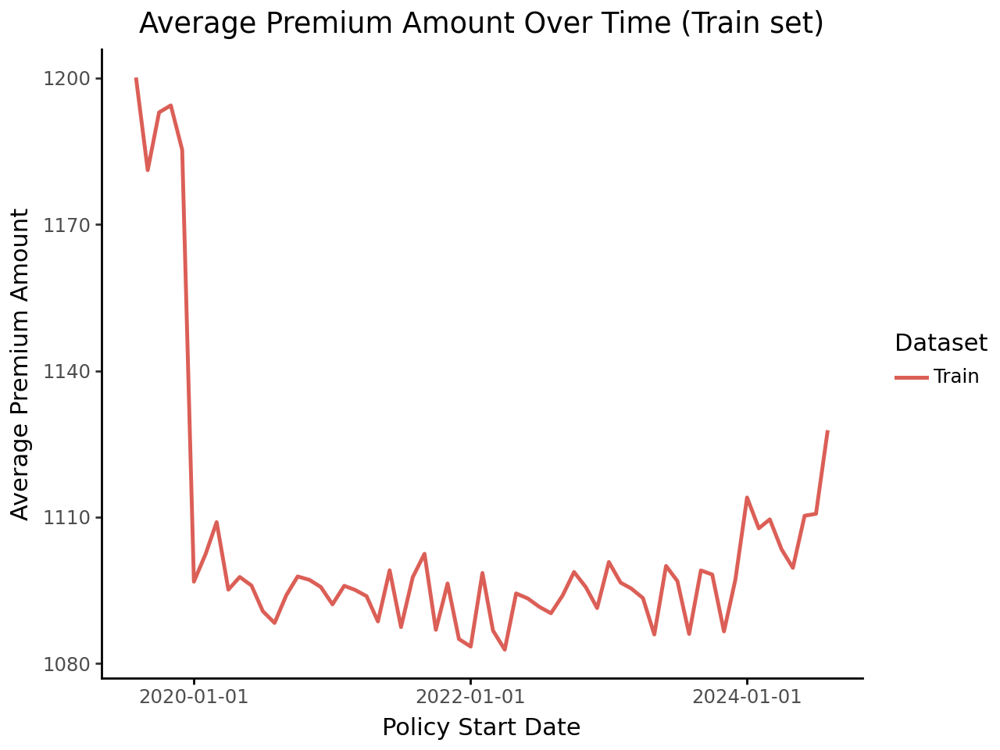

In [101]:
# Plot both datasets as relative measures
plot = (
    p9.ggplot(train_monthly_data, p9.aes(x='Policy Start Date', y='avg_premium', color='Dataset')) +
    p9.geom_line(size=1) +
    p9.labs(title='Average Premium Amount Over Time (Train set)',
            x='Policy Start Date',
            y='Average Premium Amount') +
    p9.theme_classic()
)

plot

In [107]:
full_train_csv_data[factor]

0           Married
1          Divorced
2          Divorced
3           Married
4            Single
             ...   
1199995     Married
1199996    Divorced
1199997    Divorced
1199998      Single
1199999    Divorced
Name: Marital Status, Length: 1200000, dtype: object

In [109]:
full_train_csv_data[factor]

0           Married
1          Divorced
2          Divorced
3           Married
4            Single
             ...   
1199995     Married
1199996    Divorced
1199997    Divorced
1199998      Single
1199999    Divorced
Name: Marital Status, Length: 1200000, dtype: object

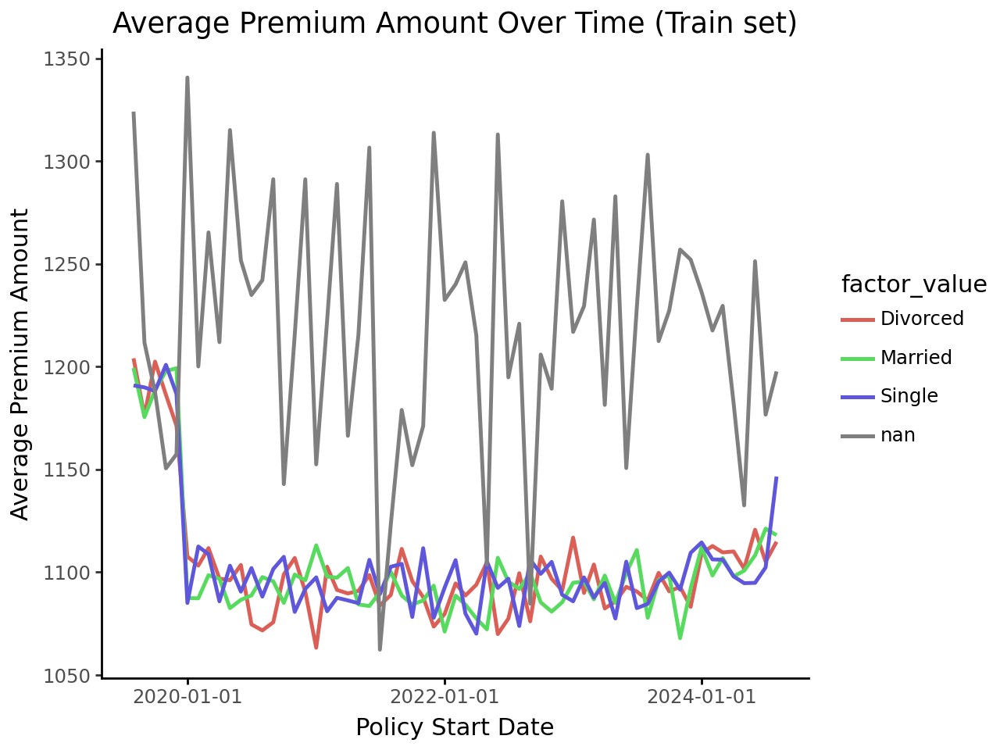

In [142]:
# Assuming `full_train_csv_data` is already loaded into DuckDB as a table, e.g., "full_train_csv_data"
factor = "Marital Status"

query = f"""
SELECT 
    DATE_TRUNC('month', "Policy Start Date") AS policy_start_month,
    "{factor}" AS factor_value,
    COUNT(*) AS record_count,
    AVG("Premium Amount") AS avg_premium
FROM full_train_csv_data
GROUP BY 
    policy_start_month, 
    factor_value
ORDER BY 
    policy_start_month, 
    factor_value
"""

train_monthly_data_by_factor = duckdb.query(query).df()

# Plot both datasets as relative measures
plot = (
    p9.ggplot(train_monthly_data_by_factor, p9.aes(x='policy_start_month', y='avg_premium', color='factor_value')) +
    p9.geom_line(size=1) +
    p9.labs(title='Average Premium Amount Over Time (Train set)',
            x='Policy Start Date',
            y='Average Premium Amount') +
    p9.theme_classic()
)

plot

# NOTA: Preguntarse, porque es importante revisar la relacion entre test y train: tipos de CV.

# Deep dive

In [143]:
from kmodes.kmodes import KModes


In [ ]:
df_encoded = df.apply(lambda x: x.astype('category').cat.codes)

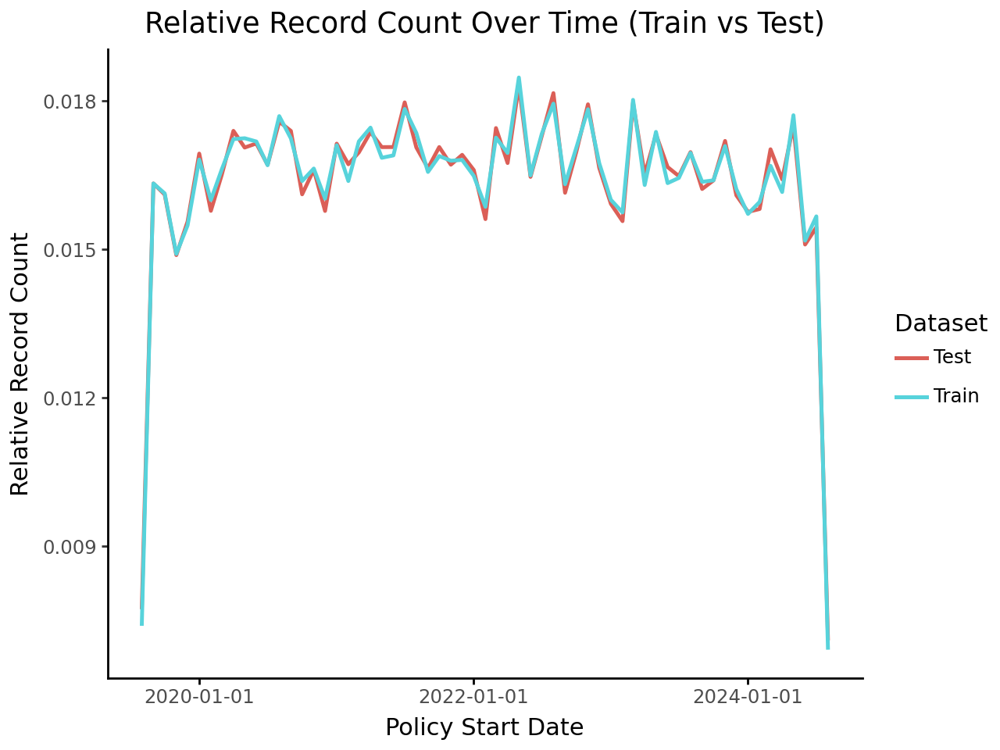

In [ ]:
full_train_csv_data[["Policy Start Date"]

# Check basico (en Sheets)

In [27]:
full_train_csv_data[sorted_columns + ["Premium Amount"]].describe(include='all').to_clipboard()

In [23]:
full_test_csv_data[sorted_columns].describe(include='all').to_clipboard()

In [80]:
train_results = {}
test_results = {}
for col in [col for col in non_numeric_cols if col != "Policy Start Date"]:
    train_results[col]= full_train_csv_data[col].value_counts(normalize=True)
    test_results[col]= full_test_csv_data[col].value_counts(normalize=True)

In [92]:
pd.DataFrame(train_results.values()).to_clipboard()

In [93]:
pd.DataFrame(test_results.values()).to_clipboard()

# Fast profile

In [70]:
from ydata_profiling import ProfileReport

train_profile = ProfileReport(full_train_csv_data, title="Train")

In [99]:
train_profile.to_file("report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Perfilado

In [8]:
train_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Eran 2M casos, me pasan 1.2M (60%). Puedo simular una situación simular con los datos de train.

In [ ]:
# Por ahora asumiremos que da lo mismo que porcion de 60% sea
seed = 42

In [10]:
dev_set = full_test_csv_data[""]

0.6